# Multilabel классификация

In [1]:
import random

from functools import partial

import matplotlib.pyplot as plt
import numpy as np
import optuna
from pandarallel import pandarallel
import pandas as pd
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, roc_curve, precision_recall_curve, auc, average_precision_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB

pd.options.display.float_format = '{:.2f}'.format
pandarallel.initialize(progress_bar=True)
random.seed(42)
np.random.seed(42)

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [2]:
df = pd.read_csv('modified_train.csv', index_col=0)

In [3]:
df['created_date'] = pd.to_datetime(df['created_date'], format='ISO8601')

In [4]:
df = df[df['created_date'] >= '2016-04-01']

In [5]:
# Сортировка данных для дальнейшего разделения по временной метке
df = df.sort_values('created_date').reset_index(drop=True)

`ctws` - столбец с обработанным текстом, в нем нет пунктуации и стоп-слов, токены разделены пробелами. Столбец был получен который был получен в ходе EDA.

In [ ]:
df['ctws'].fillna('', inplace=True)

In [7]:
labels = ['toxicity_b', 'obscene_b', 'identity_attack_b', 'insult_b', 'threat_b', 'sexual_explicit_b']

Выбор даты для разделения на обучающую и тестовую выборки. Для разделения используется подход Out-Of-Time (OOT)

In [8]:
split_date = df.iloc[int(len(df) * 0.8)]['created_date']
split_date

Timestamp('2017-09-03 13:54:26.194849+0000', tz='UTC')

In [9]:
train_val_df = df[df['created_date'] <= split_date]
test_df = df[df['created_date'] > split_date]

In [10]:
X_test = test_df['ctws']
y_test = test_df[labels]

Далее повторно разбиваем на обучающую и валидационную выборки, используя тот же подход.

In [11]:
split_date = train_val_df.iloc[int(len(train_val_df) * 0.8)]['created_date']
split_date

Timestamp('2017-07-06 03:02:41.334553+0000', tz='UTC')

In [12]:
train_df = train_val_df[train_val_df['created_date'] <= split_date]
val_df = train_val_df[train_val_df['created_date'] > split_date]

In [13]:
X_train = train_df['ctws']
y_train = train_df[labels]

In [14]:
X_val = val_df['ctws']
y_val= val_df[labels]

Проверка медианных значений выборок.

Значения примерно одинаковые.

In [15]:
y_train.mean(), y_test.mean(), y_val.mean()

(toxicity_b          0.11
 obscene_b           0.01
 identity_attack_b   0.01
 insult_b            0.08
 threat_b            0.00
 sexual_explicit_b   0.00
 dtype: float64,
 toxicity_b          0.12
 obscene_b           0.01
 identity_attack_b   0.02
 insult_b            0.09
 threat_b            0.00
 sexual_explicit_b   0.01
 dtype: float64,
 toxicity_b          0.12
 obscene_b           0.01
 identity_attack_b   0.02
 insult_b            0.09
 threat_b            0.00
 sexual_explicit_b   0.00
 dtype: float64)

Функция `train_and_predict_toxicity_multilabel` обучает модель, делает предсказание и возвращает полученные метрики.

Функция `plot_metrics_multi` отрисовывает таблицы и графики с полученными метриками.

In [16]:
from sklearn.metrics import classification_report

def train_and_predict_toxicity_multilabel(model, X_train, X_val, X_test, y_train):
    clf = MultiOutputClassifier(model, n_jobs=-1)
    clf.fit(X_train, y_train)

    y_pred_train = clf.predict(X_train)
    y_pred_val = clf.predict(X_val)
    y_pred_test = clf.predict(X_test)

    if hasattr(model, 'predict_proba'):
        y_pred_proba_train = np.array([arr[:, 1] for arr in clf.predict_proba(X_train)]).T
        y_pred_proba_val = np.array([arr[:, 1] for arr in clf.predict_proba(X_val)]).T
        y_pred_proba_test = np.array([arr[:, 1] for arr in clf.predict_proba(X_test)]).T
    elif hasattr(model, 'decision_function'):
        y_pred_proba_train = np.array([estimator.decision_function(X_train) for estimator in clf.estimators_]).T
        y_pred_proba_val = np.array([estimator.decision_function(X_val) for estimator in clf.estimators_]).T
        y_pred_proba_test = np.array([estimator.decision_function(X_test) for estimator in clf.estimators_]).T
    else:
        y_pred_proba_train = []
        y_pred_proba_val = []
        y_pred_proba_test = []

    return y_pred_train, y_pred_val, y_pred_test, y_pred_proba_train, y_pred_proba_val, y_pred_proba_test

def plot_metrics_multi(
    y_train, y_val, y_test,
    y_pred_train, y_pred_val, y_pred_test,
    y_pred_proba_train, y_pred_proba_val, y_pred_proba_test,
    label_names, model_name
):
    y_pred_dict = {
        'train': y_pred_train,
        'train_proba': y_pred_proba_train,
        'val': y_pred_val,
        'val_proba': y_pred_proba_val,
        'test': y_pred_test,
        'test_proba': y_pred_proba_test
    }

    y_true_dict = {
        'train': y_train,
        'val': y_val,
        'test': y_test
    }

    def plot_metrics_table(y_true, y_pred, set_type, ax):
        tbl = pd.DataFrame.from_dict(classification_report(y_true, y_pred, zero_division=0, target_names=label_names, output_dict=True)) \
            .drop(['weighted avg', 'samples avg'], axis=1) \
            .T \
            .astype('float64') \
            .apply(lambda s: s.apply('{:,.0f}'.format) if s.name=='support' else s.apply('{:.2f}'.format), axis=0)
        ax_tbl = ax.table(cellText=tbl.values, rowLabels=tbl.index.values, colLabels=tbl.columns.values, loc='center')
        ax_tbl.auto_set_font_size(False)
        ax_tbl.set_fontsize('medium')
        ax.axis('off')
        ax_tbl.scale(1, 0.7)

        if set_type=='train':
            title = 'TRAIN'
        elif set_type=='val':
            title = 'VALIDATION'
        else:
            title = 'TEST'
            
        ax.set_title(title, loc='left')

    def plot_roc_curve(y_true, y_pred_proba, ax):
        for i, label in enumerate(label_names):
            fpr, tpr, _ = roc_curve(y_true[:,i], y_pred_proba[:,i])
            ax.plot(fpr, tpr, label=f'ROC for {label}, AUC={auc(fpr, tpr):.2f}')

        fpr_micro, tpr_micro, _ = roc_curve(y_true.ravel(), y_pred_proba.ravel())
        ax.plot(fpr_micro, tpr_micro, '--', label=f'micro-average ROC curve, AUC={auc(fpr_micro, tpr_micro):.2f}')

        ax.plot([0, 1], [0, 1], 'k--', lw=0.5, label='Chance level, AUC=0.5')

        ax.set_xlabel('FPR')
        ax.set_ylabel('TPR')
        ax.legend(fontsize='x-small', loc='lower right')
        ax.set_title(f'ROC', loc='left', fontsize='small')
        ax.grid()
        ax.set_ylim(bottom=0, top=1)
        ax.set_xlim(left=0, right=1)

    def plot_pr_curve(y_true, y_pred_proba, ax):
        for i, label in enumerate(label_names):
            prec, rec, _ = precision_recall_curve(y_true[:,i], y_pred_proba[:,i])
            sorted_index = np.argsort(rec)
            prec = prec[sorted_index]
            rec = rec[sorted_index]
            ax.plot(rec, prec, label=f'P-R for {label}, AUC={auc(rec, prec):.2f}, AP={average_precision_score(y_true[:,i], y_pred_proba[:,i]):.2f}')

        prec_micro, rec_micro, _ = precision_recall_curve(y_true.ravel(), y_pred_proba.ravel())
        sorted_index = np.argsort(rec_micro)
        prec_micro = prec_micro[sorted_index]
        rec_micro = rec_micro[sorted_index]
        ax.plot(
            rec_micro, prec_micro, '--',
            label=(
                f'micro-average PR curve, '
                f'AUC={auc(rec_micro, prec_micro):.2f}, '
                f'AP={average_precision_score(y_true, y_pred_proba, average="micro"):.2f}'
            )
        )

        f_scores = np.linspace(0.2, 0.8, num=4)
        for f_score in f_scores:
            x = np.linspace(0.01, 1)
            y = f_score * x / (2 * x - f_score)
            (l,) = ax.plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2)
            ax.annotate(f'f1={f_score:0.1f}', xy=(0.9, y[45] + 0.02), fontsize='x-small')

        ax.set_ylim(bottom=0, top=1)
        ax.set_xlim(left=0, right=1)

        handles, labels = ax.get_legend_handles_labels()
        handles.extend([l])
        labels.extend(['iso f1 curves'])
        ax.legend(handles=handles, labels=labels, loc='best', fontsize='x-small')
        ax.set_xlabel('Recall')
        ax.set_ylabel('Precision')
        ax.set_title(f'Precision-Recall', loc='left', fontsize='small')
        ax.grid()
    
    fig = plt.figure(figsize=(16, 11), layout='constrained')
    gs = fig.add_gridspec(3, 3, height_ratios=[0.18, 0.41, 0.41])
    nrows, ncols = gs.get_geometry()
    ax = [[fig.add_subplot(gs[row, col]) for col in range(ncols)] for row in range(nrows)]

    for colnum, set_type in enumerate(['train', 'val', 'test']):
        plot_metrics_table(y_true_dict[set_type], y_pred_dict[set_type], set_type, ax[0][colnum])
        plot_roc_curve(y_true_dict[set_type].values, y_pred_dict[set_type+'_proba'], ax[1][colnum])
        plot_pr_curve(y_true_dict[set_type].values, y_pred_dict[set_type+'_proba'], ax[2][colnum])

    fig.suptitle(f'Multilabel classification metrics for {model_name}')

In [17]:
# Функция получеия мешка слов
def get_bows(X_train, X_val, X_test, ngram_range=(1, 1)):
    vectorizer = CountVectorizer(ngram_range=ngram_range)
    return vectorizer.fit_transform(X_train), vectorizer.transform(X_val), vectorizer.transform(X_test)


# Векторизация TF-IDF
def get_tfidf(X_train, X_val, X_test, ngram_range=(1, 1)):
    vectorizer = TfidfVectorizer(ngram_range=ngram_range)
    return vectorizer.fit_transform(X_train), vectorizer.transform(X_val), vectorizer.transform(X_test)

In [18]:
X_train_bow, X_val_bow, X_test_bow = get_bows(X_train, X_val, X_test)

In [19]:
X_train_tfidf, X_val_tfidf, X_test_tfidf = get_tfidf(X_train, X_val, X_test)

In [44]:
X_train_bow_ngrams, X_val_bow_ngrams, X_test_bow_ngrams = get_bows(X_train, X_val, X_test, ngram_range=(1, 2))

In [45]:
X_train_tfidf_ngrams, X_val_tfidf_ngrams, X_test_tfidf_ngrams = get_tfidf(X_train, X_val, X_test, ngram_range=(1, 2))

Так же как и для бинарной классификации одной из основных метрик, на которую будем полагаться при оценивании моделей, будет являться гармоническое среднее между метриками Precision и Recall - F1.

Обучение так же будет производиться для моделей Логистической регрессии (`LogisticRegression`), SVM (`LinearSVC`) и Наивного Байеса (`MultinomialNB`) с мешком слов (BoW) и TF-IDF. Для Наивного Байеса будут взяты слова и биграммы.

## Обучение с дефолтными параметрами моделей

### Обучение с мешком слов

#### Логистическая регрессия

In [45]:
(
    y_default_log_reg_bow_pred_train,
    y_default_log_reg_bow_pred_val,
    y_default_log_reg_bow_pred_test,
    y_default_log_reg_bow_pred_proba_train,
    y_default_log_reg_bow_pred_proba_val,
    y_default_log_reg_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

/Users/lev_k/HSE/YP/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lev_k/HSE/YP/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Здесь можно заметить, что логистической регрессии не хватило количества итераций по умолчанию, сразу понятно, какой параметр точно нужно будет изменить.

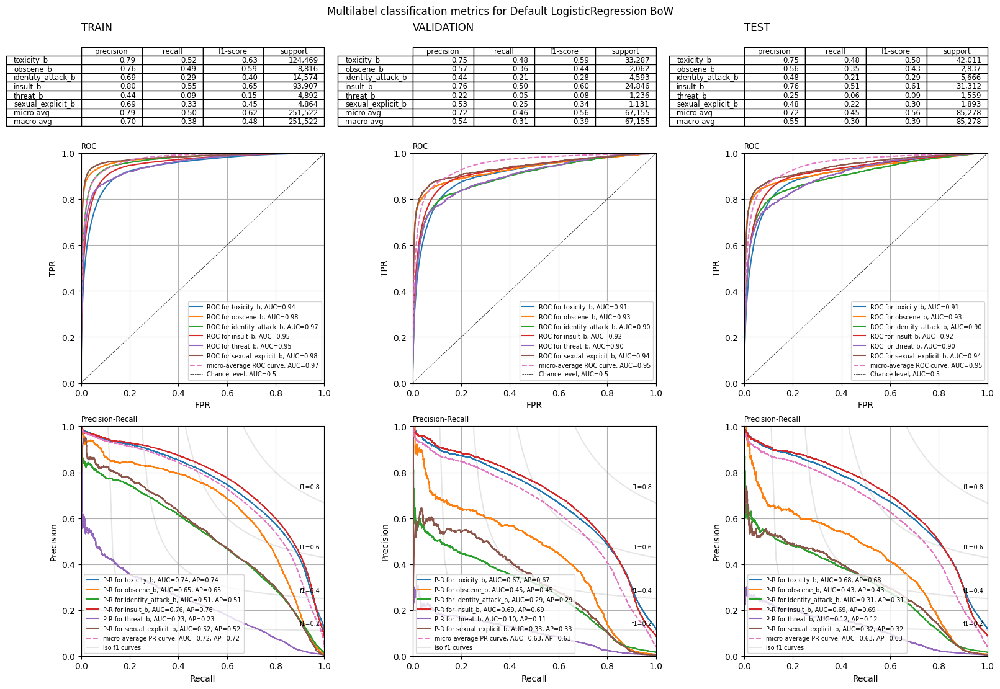

In [55]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_log_reg_bow_pred_train,
    y_default_log_reg_bow_pred_val,
    y_default_log_reg_bow_pred_test,
    y_default_log_reg_bow_pred_proba_train,
    y_default_log_reg_bow_pred_proba_val,
    y_default_log_reg_bow_pred_proba_test,
    y_train.columns,
    'Default LogisticRegression BoW'
)

#### SVM

In [23]:
(
    y_default_svm_bow_pred_train,
    y_default_svm_bow_pred_val,
    y_default_svm_bow_pred_test,
    y_default_svm_bow_pred_proba_train,
    y_default_svm_bow_pred_proba_val,
    y_default_svm_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(dual=False),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

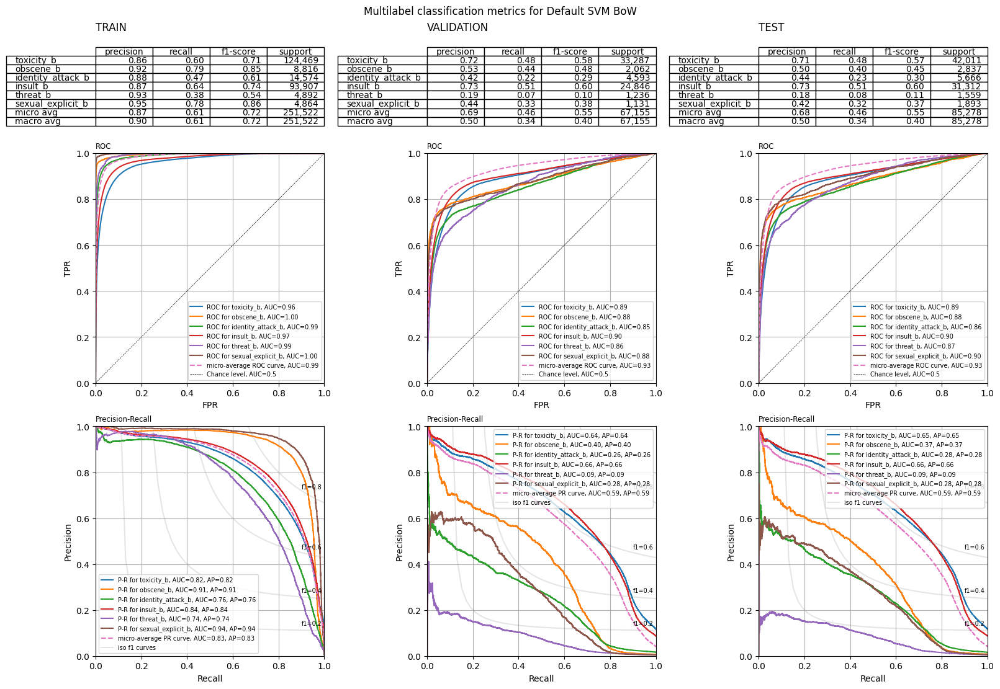

In [24]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_svm_bow_pred_train,
    y_default_svm_bow_pred_val,
    y_default_svm_bow_pred_test,
    y_default_svm_bow_pred_proba_train,
    y_default_svm_bow_pred_proba_val,
    y_default_svm_bow_pred_proba_test,
    y_train.columns,
    'Default SVM BoW'
)

#### Наивный Байес

##### Слова

In [ ]:
(
    y_default_nb_bow_pred_train,
    y_default_nb_bow_pred_val,
    y_default_nb_bow_pred_test,
    y_default_nb_bow_pred_proba_train,
    y_default_nb_bow_pred_proba_val,
    y_default_nb_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

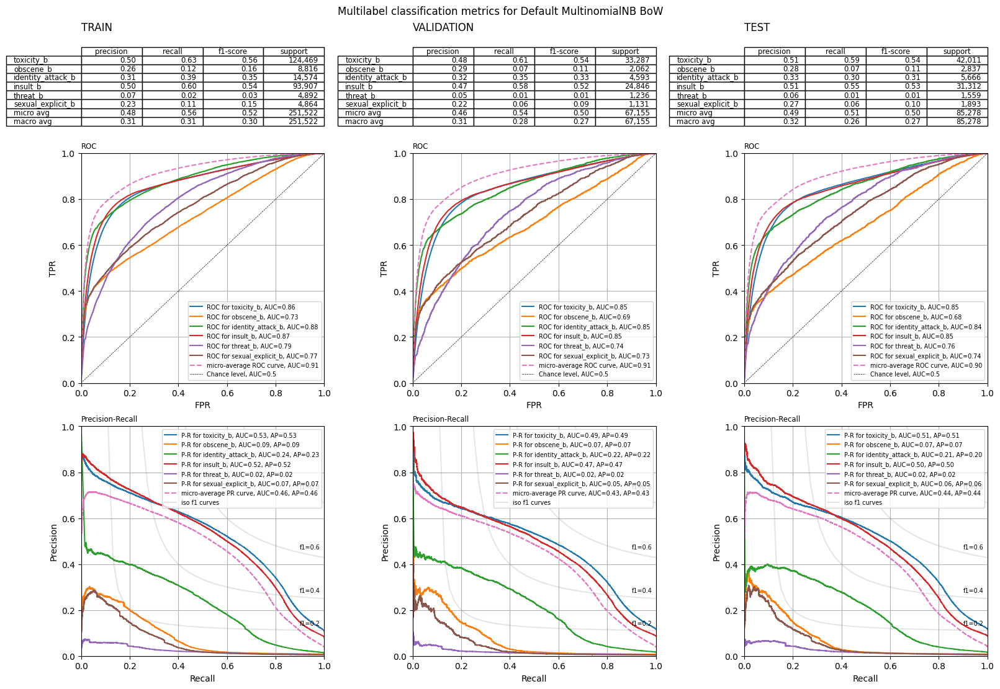

In [66]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_bow_pred_train,
    y_default_nb_bow_pred_val,
    y_default_nb_bow_pred_test,
    y_default_nb_bow_pred_proba_train,
    y_default_nb_bow_pred_proba_val,
    y_default_nb_bow_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB BoW'
)

##### Биграммы

In [52]:
(
    y_default_nb_bow_ngrams_pred_train,
    y_default_nb_bow_ngrams_pred_val,
    y_default_nb_bow_ngrams_pred_test,
    y_default_nb_bow_ngrams_pred_proba_train,
    y_default_nb_bow_ngrams_pred_proba_val,
    y_default_nb_bow_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_bow_ngrams,
    X_val=X_val_bow_ngrams,
    X_test=X_test_bow_ngrams,
    y_train=y_train,
)

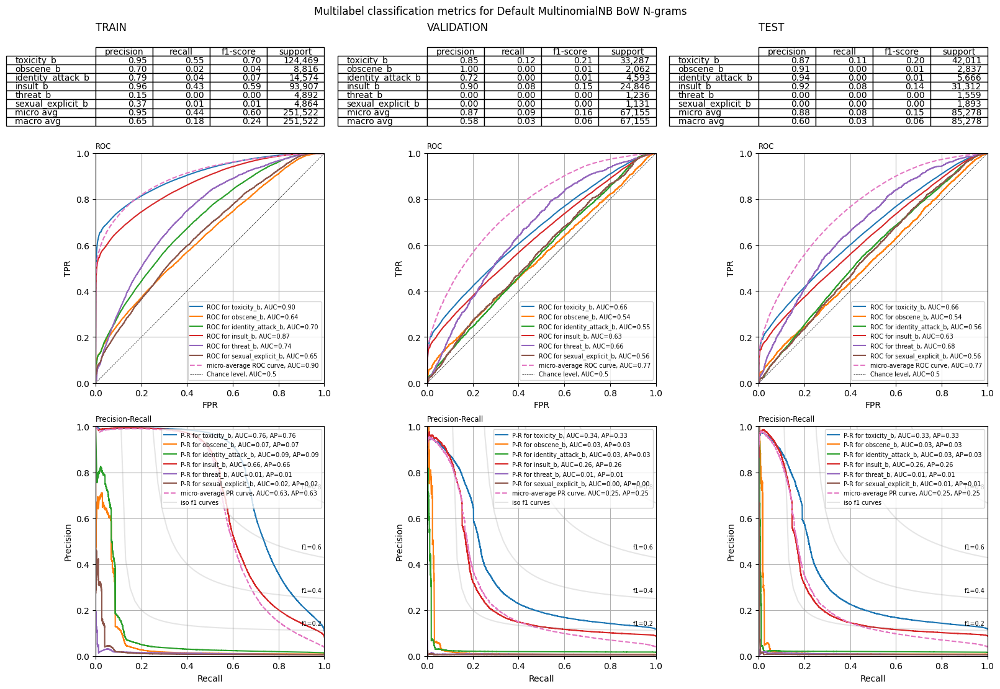

In [53]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_bow_ngrams_pred_train,
    y_default_nb_bow_ngrams_pred_val,
    y_default_nb_bow_ngrams_pred_test,
    y_default_nb_bow_ngrams_pred_proba_train,
    y_default_nb_bow_ngrams_pred_proba_val,
    y_default_nb_bow_ngrams_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB BoW N-grams'
)

Без подбора гиперпараметров лучше всего по метрике F1 (micro avg) и AUC дает предсказания на валидационной и тестовой выборках модель Логистическая регрессия. Второй наилучшей моделью является LinearSVC. Все так же, как в случае с бинарной классификацией. Хотя у LinearSVC наблюдается довольно сильное переобучение.

Затем идет модель MultinomialNB обученные на простом мешке слов, хотя с классами `threat` и `sexual_explicit`. На мешке слов с биграммами все совсем плохо, она переобучается на тренировочных данных, а затем выдает довольно плохие предсказания на валидационной и тестовой выборках, классы `threat` и `sexual_explicit` она не видит вообще, об этом говорят нулевые знаения метрик у этих классов на валидации и тесте.

В целом все модели испытывают трудности с классами `threat`, `sexual_explicit` и `identity_attack` из-за малого количества объектов в них. Предсказание класса `obscene` близко к случайному.

### Обучение с TF-IDF

#### Логистическая регрессия

In [70]:
(
    y_default_log_reg_tfidf_pred_train,
    y_default_log_reg_tfidf_pred_val,
    y_default_log_reg_tfidf_pred_test,
    y_default_log_reg_tfidf_pred_proba_train,
    y_default_log_reg_tfidf_pred_proba_val,
    y_default_log_reg_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

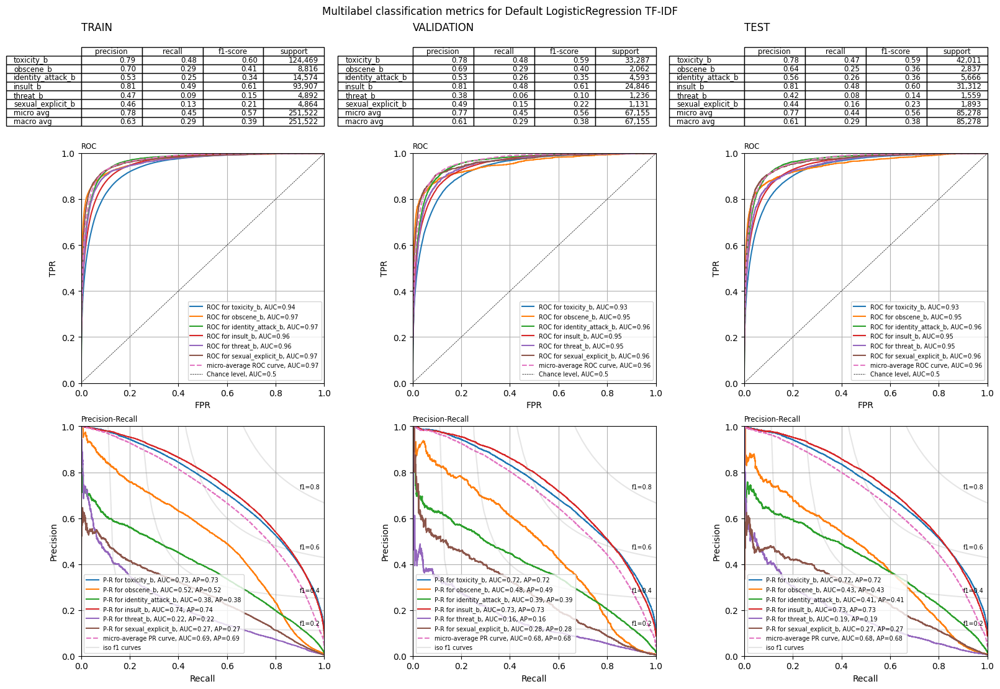

In [71]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_log_reg_tfidf_pred_train,
    y_default_log_reg_tfidf_pred_val,
    y_default_log_reg_tfidf_pred_test,
    y_default_log_reg_tfidf_pred_proba_train,
    y_default_log_reg_tfidf_pred_proba_val,
    y_default_log_reg_tfidf_pred_proba_test,
    y_train.columns,
    'Default LogisticRegression TF-IDF'
)

#### SVM

In [25]:
(
    y_default_svm_tfidf_pred_train,
    y_default_svm_tfidf_pred_val,
    y_default_svm_tfidf_pred_test,
    y_default_svm_tfidf_pred_proba_train,
    y_default_svm_tfidf_pred_proba_val,
    y_default_svm_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(dual=False),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

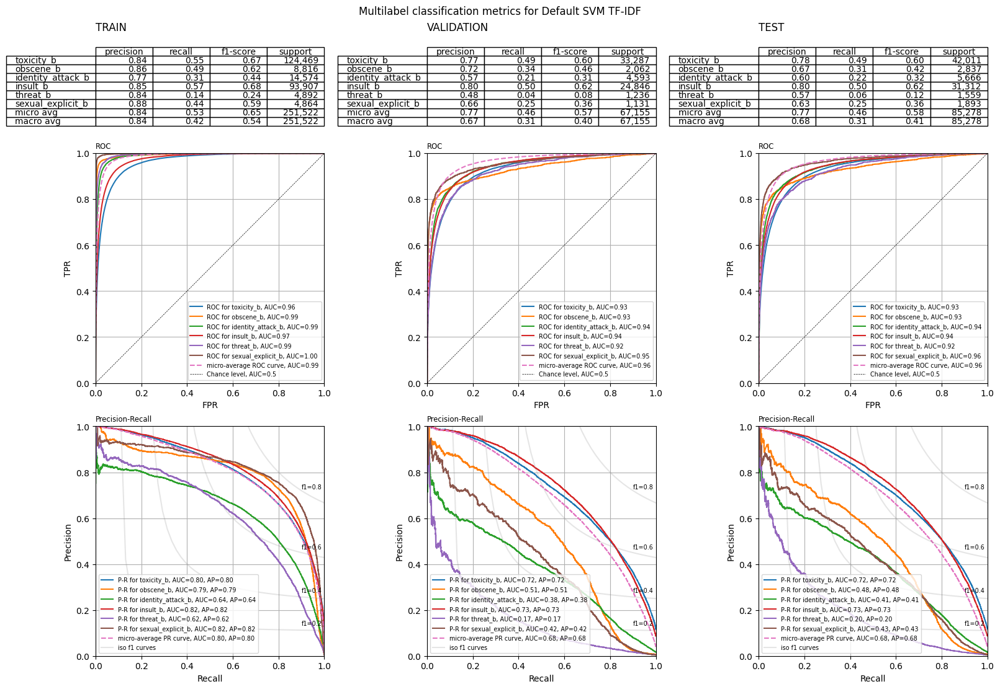

In [26]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_svm_tfidf_pred_train,
    y_default_svm_tfidf_pred_val,
    y_default_svm_tfidf_pred_test,
    y_default_svm_tfidf_pred_proba_train,
    y_default_svm_tfidf_pred_proba_val,
    y_default_svm_tfidf_pred_proba_test,
    y_train.columns,
    'Default SVM TF-IDF'
)

#### Наивный Байес

##### Слова

In [59]:
(
    y_default_nb_tfidf_pred_train,
    y_default_nb_tfidf_pred_val,
    y_default_nb_tfidf_pred_test,
    y_default_nb_tfidf_pred_proba_train,
    y_default_nb_tfidf_pred_proba_val,
    y_default_nb_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

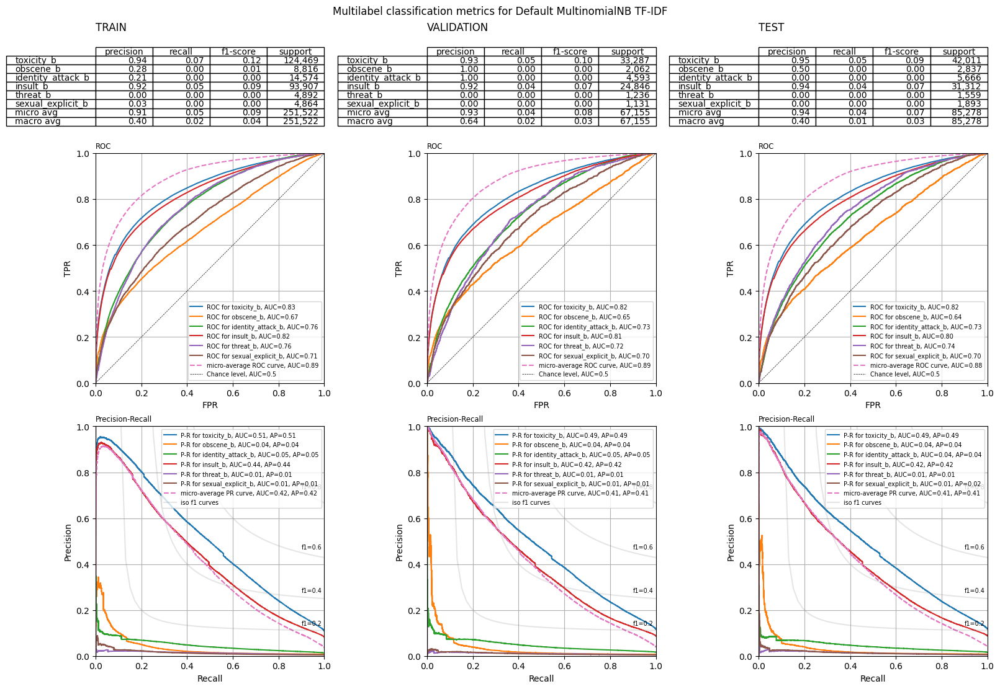

In [60]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_tfidf_pred_train,
    y_default_nb_tfidf_pred_val,
    y_default_nb_tfidf_pred_test,
    y_default_nb_tfidf_pred_proba_train,
    y_default_nb_tfidf_pred_proba_val,
    y_default_nb_tfidf_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB TF-IDF'
)

##### Биграммы

In [61]:
(
    y_default_nb_tfidf_ngrams_pred_train,
    y_default_nb_tfidf_ngrams_pred_val,
    y_default_nb_tfidf_ngrams_pred_test,
    y_default_nb_tfidf_ngrams_pred_proba_train,
    y_default_nb_tfidf_ngrams_pred_proba_val,
    y_default_nb_tfidf_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_tfidf_ngrams,
    X_val=X_val_tfidf_ngrams,
    X_test=X_test_tfidf_ngrams,
    y_train=y_train,
)

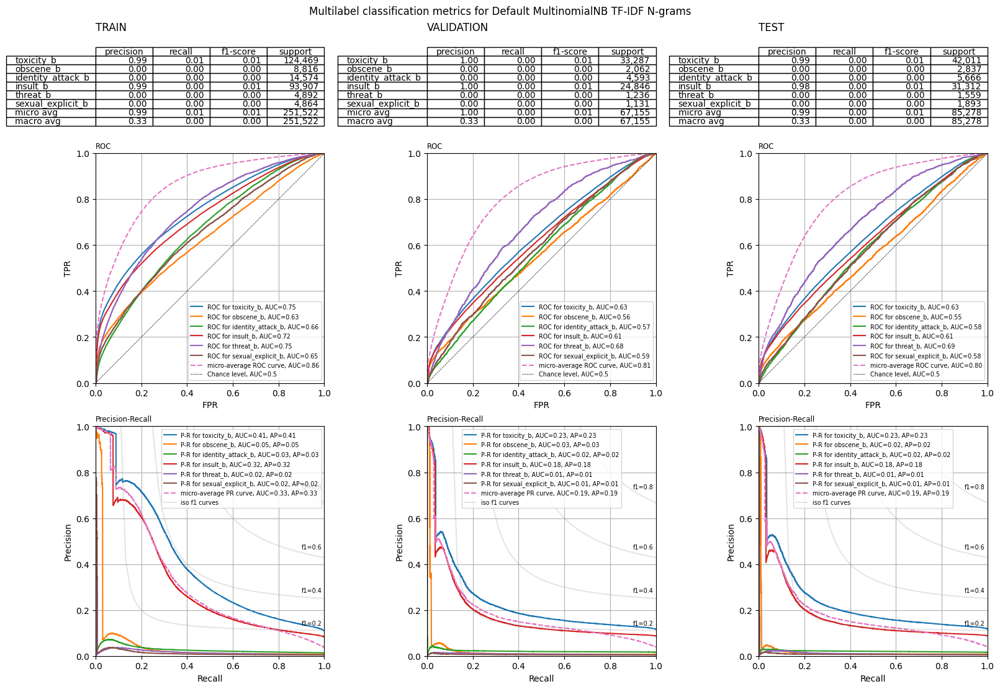

In [62]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_tfidf_ngrams_pred_train,
    y_default_nb_tfidf_ngrams_pred_val,
    y_default_nb_tfidf_ngrams_pred_test,
    y_default_nb_tfidf_ngrams_pred_proba_train,
    y_default_nb_tfidf_ngrams_pred_proba_val,
    y_default_nb_tfidf_ngrams_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB TF-IDF N-grams'
)

В целом ситуация осталсь примерно такой же, как и при обучении на BoW. Однако метрики у двух лучших моделей в плане F1 немного подросли (хоть и не для всех классов) и теперь лучше всего предсказывает модель LinearSVC. Переобучение у модели LinearSVC снизилось, а у Лог. регрессии его вообще нет.

Модель MultinomialNB показала себя совсем плохо со словами и биграммами, F1 стремится к нулю.

## Обучение с заданными параметрами

### Обучение с мешком слов

#### Логистическая регрессия

In [37]:
log_reg_bow_handle_params = {'C': 1, 'max_iter': 1000}
(
    y_handle_params_log_reg_bow_pred_train,
    y_handle_params_log_reg_bow_pred_val,
    y_handle_params_log_reg_bow_pred_test,
    y_handle_params_log_reg_bow_pred_proba_train,
    y_handle_params_log_reg_bow_pred_proba_val,
    y_handle_params_log_reg_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_bow_handle_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

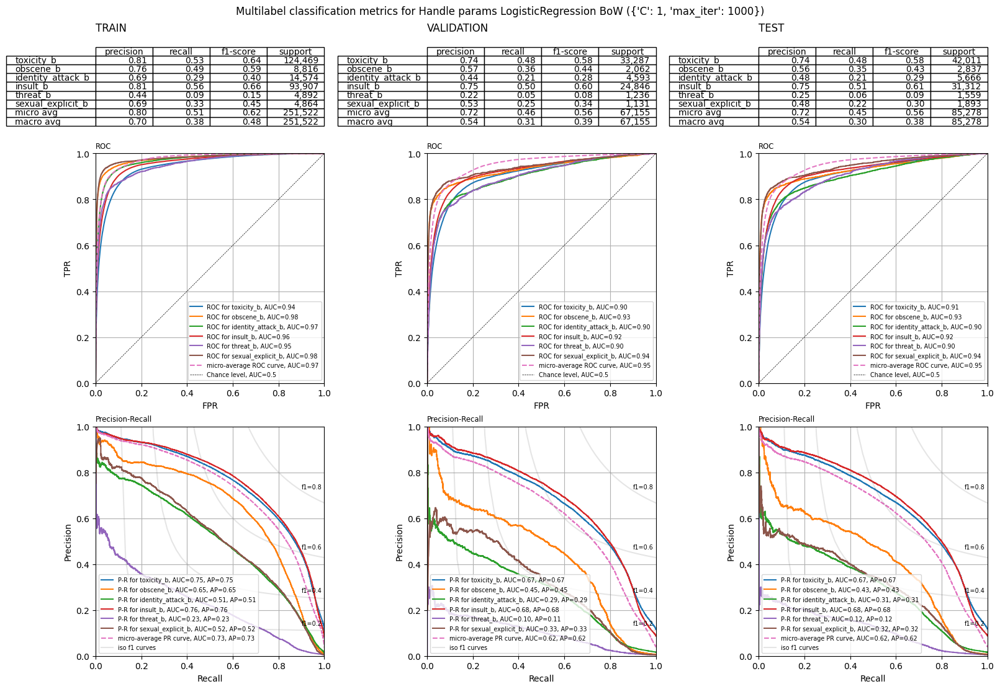

In [38]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_log_reg_bow_pred_train,
    y_handle_params_log_reg_bow_pred_val,
    y_handle_params_log_reg_bow_pred_test,
    y_handle_params_log_reg_bow_pred_proba_train,
    y_handle_params_log_reg_bow_pred_proba_val,
    y_handle_params_log_reg_bow_pred_proba_test,
    y_train.columns,
    f'Handle params LogisticRegression BoW ({log_reg_bow_handle_params})'
)

#### SVM

In [39]:
svm_bow_handle_params = {'C': 0.5, 'dual': False}
(
    y_handle_params_svm_bow_pred_train,
    y_handle_params_svm_bow_pred_val,
    y_handle_params_svm_bow_pred_test,
    y_handle_params_svm_bow_pred_proba_train,
    y_handle_params_svm_bow_pred_proba_val,
    y_handle_params_svm_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_bow_handle_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

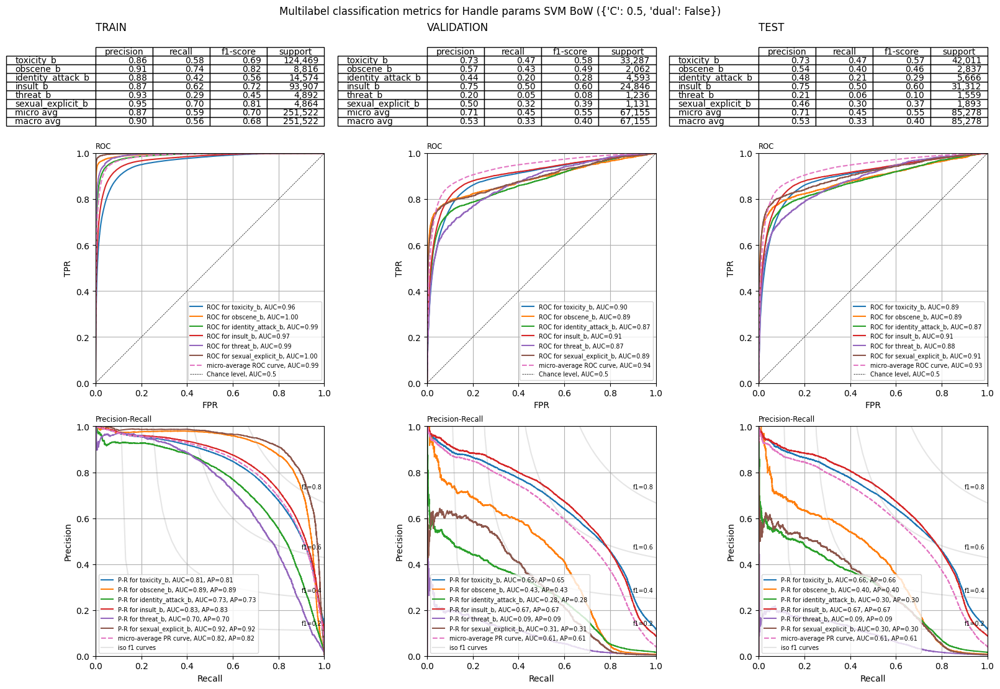

In [40]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_svm_bow_pred_train,
    y_handle_params_svm_bow_pred_val,
    y_handle_params_svm_bow_pred_test,
    y_handle_params_svm_bow_pred_proba_train,
    y_handle_params_svm_bow_pred_proba_val,
    y_handle_params_svm_bow_pred_proba_test,
    y_train.columns,
    f'Handle params SVM BoW ({svm_bow_handle_params})'
)

#### Наивный Байес

##### Слова

In [41]:
nb_bow_handle_params = {'alpha': 0.1}
(
    y_handle_params_nb_bow_pred_train,
    y_handle_params_nb_bow_pred_val,
    y_handle_params_nb_bow_pred_test,
    y_handle_params_nb_bow_pred_proba_train,
    y_handle_params_nb_bow_pred_proba_val,
    y_handle_params_nb_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_handle_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

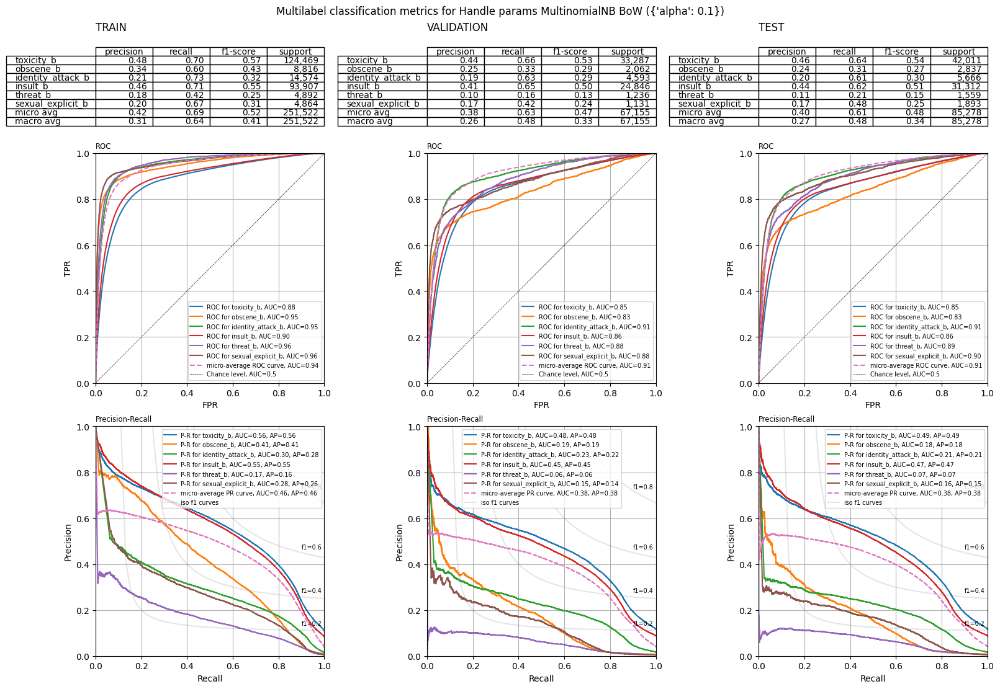

In [42]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_bow_pred_train,
    y_handle_params_nb_bow_pred_val,
    y_handle_params_nb_bow_pred_test,
    y_handle_params_nb_bow_pred_proba_train,
    y_handle_params_nb_bow_pred_proba_val,
    y_handle_params_nb_bow_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB BoW ({nb_bow_handle_params})'
)

##### Биграммы

In [46]:
nb_bow_ngrams_handle_params = {'alpha': 0.1}
(
    y_handle_params_nb_bow_ngrams_pred_train,
    y_handle_params_nb_bow_ngrams_pred_val,
    y_handle_params_nb_bow_ngrams_pred_test,
    y_handle_params_nb_bow_ngrams_pred_proba_train,
    y_handle_params_nb_bow_ngrams_pred_proba_val,
    y_handle_params_nb_bow_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_ngrams_handle_params),
    X_train=X_train_bow_ngrams,
    X_val=X_val_bow_ngrams,
    X_test=X_test_bow_ngrams,
    y_train=y_train,
)

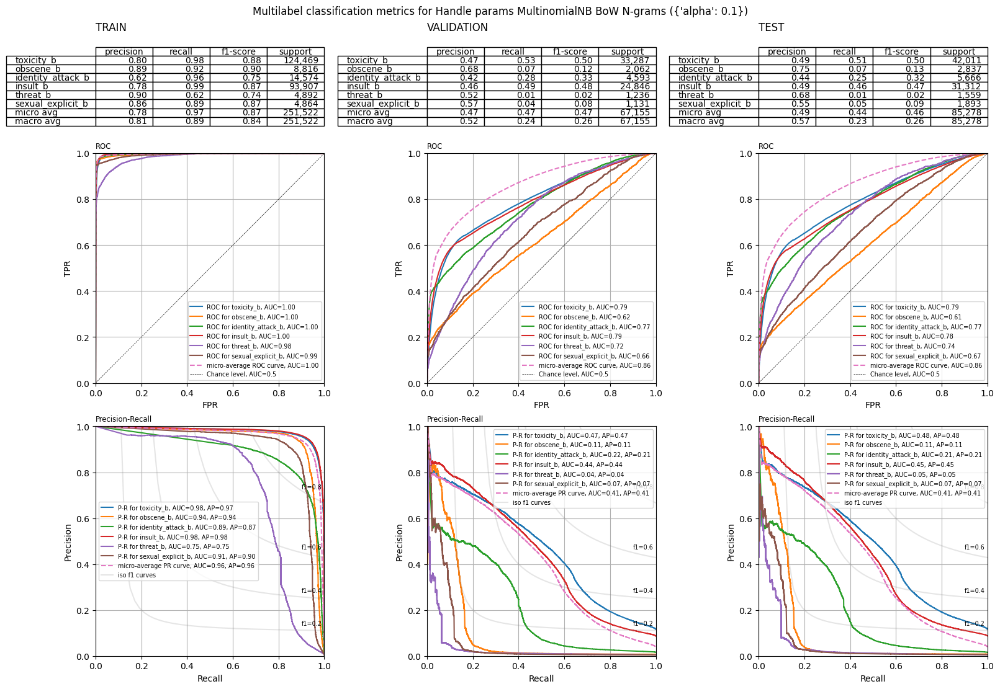

In [47]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_bow_ngrams_pred_train,
    y_handle_params_nb_bow_ngrams_pred_val,
    y_handle_params_nb_bow_ngrams_pred_test,
    y_handle_params_nb_bow_ngrams_pred_proba_train,
    y_handle_params_nb_bow_ngrams_pred_proba_val,
    y_handle_params_nb_bow_ngrams_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB BoW N-grams ({nb_bow_ngrams_handle_params})'
)

В ходе подбора параметров для моделей LogisticRegression и LinearSVC практически ничего не поменялось, т.к. параметры по умолчанию и так оказались практически самыми оптимальными.

В случае с MultinomialNB на словах улучшилась F1 для некоторых классов и совем немного снизилось переобучение. На биграммах стало заметно лучше (относительно параметров по умолчанию), если судить по метрикам на валидации и тесте, но переобучение практически на всех классах улетело в космос.

### Обучение с TF-IDF

#### Логистическая регрессия

In [48]:
log_reg_tfidf_handle_params = {'C': 1, 'max_iter': 1000}
(
    y_handle_params_log_reg_tfidf_pred_train,
    y_handle_params_log_reg_tfidf_pred_val,
    y_handle_params_log_reg_tfidf_pred_test,
    y_handle_params_log_reg_tfidf_pred_proba_train,
    y_handle_params_log_reg_tfidf_pred_proba_val,
    y_handle_params_log_reg_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_tfidf_handle_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

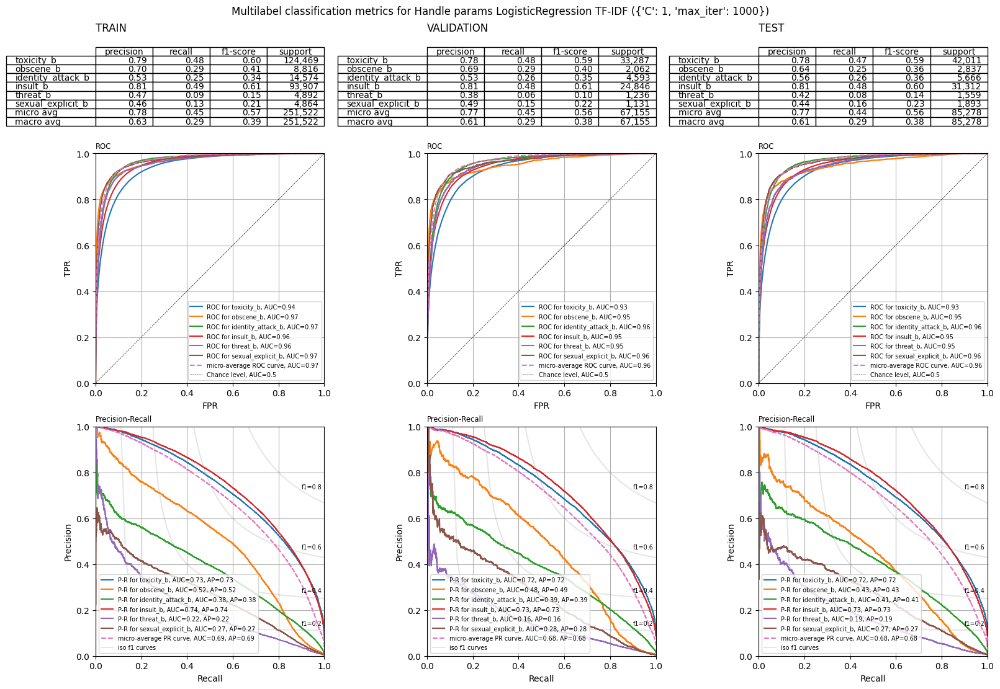

In [49]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_log_reg_tfidf_pred_train,
    y_handle_params_log_reg_tfidf_pred_val,
    y_handle_params_log_reg_tfidf_pred_test,
    y_handle_params_log_reg_tfidf_pred_proba_train,
    y_handle_params_log_reg_tfidf_pred_proba_val,
    y_handle_params_log_reg_tfidf_pred_proba_test,
    y_train.columns,
    f'Handle params LogisticRegression TF-IDF ({log_reg_tfidf_handle_params})'
)

#### SVM

In [50]:
svm_tfidf_handle_params = {'C': 1, 'dual': False}
(
    y_handle_params_svm_tfidf_pred_train,
    y_handle_params_svm_tfidf_pred_val,
    y_handle_params_svm_tfidf_pred_test,
    y_handle_params_svm_tfidf_pred_proba_train,
    y_handle_params_svm_tfidf_pred_proba_val,
    y_handle_params_svm_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_tfidf_handle_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

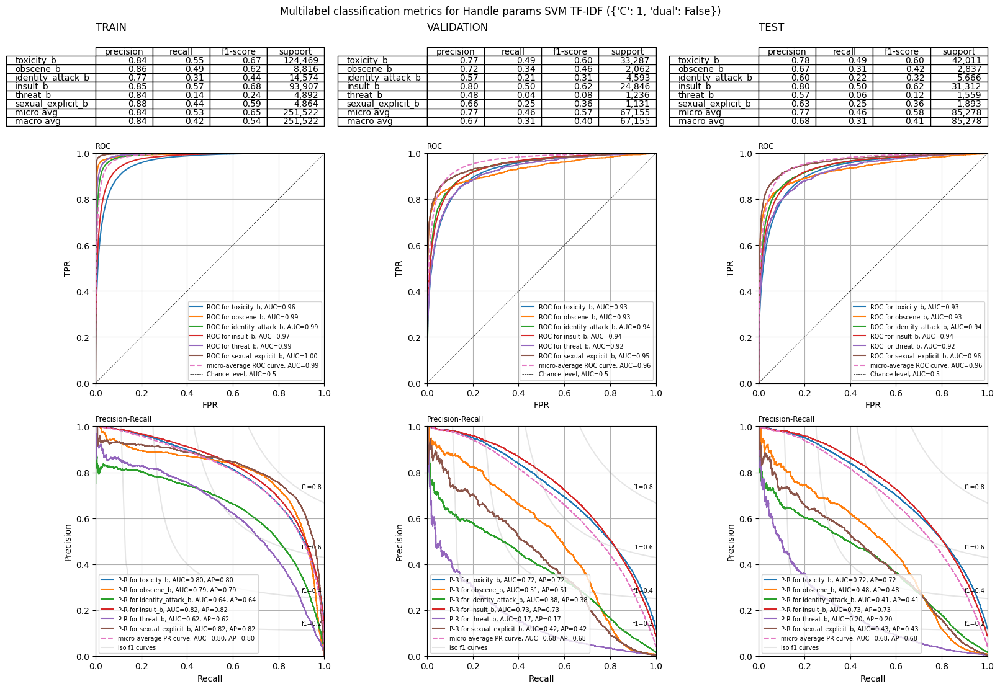

In [51]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_svm_tfidf_pred_train,
    y_handle_params_svm_tfidf_pred_val,
    y_handle_params_svm_tfidf_pred_test,
    y_handle_params_svm_tfidf_pred_proba_train,
    y_handle_params_svm_tfidf_pred_proba_val,
    y_handle_params_svm_tfidf_pred_proba_test,
    y_train.columns,
    f'Handle params SVM TF-IDF ({svm_tfidf_handle_params})'
)

#### Наивный Байес

##### Слова

In [52]:
nb_tfidf_handle_params = {'alpha': 0.01}
(
    y_handle_params_nb_tfidf_pred_train,
    y_handle_params_nb_tfidf_pred_val,
    y_handle_params_nb_tfidf_pred_test,
    y_handle_params_nb_tfidf_pred_proba_train,
    y_handle_params_nb_tfidf_pred_proba_val,
    y_handle_params_nb_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_handle_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

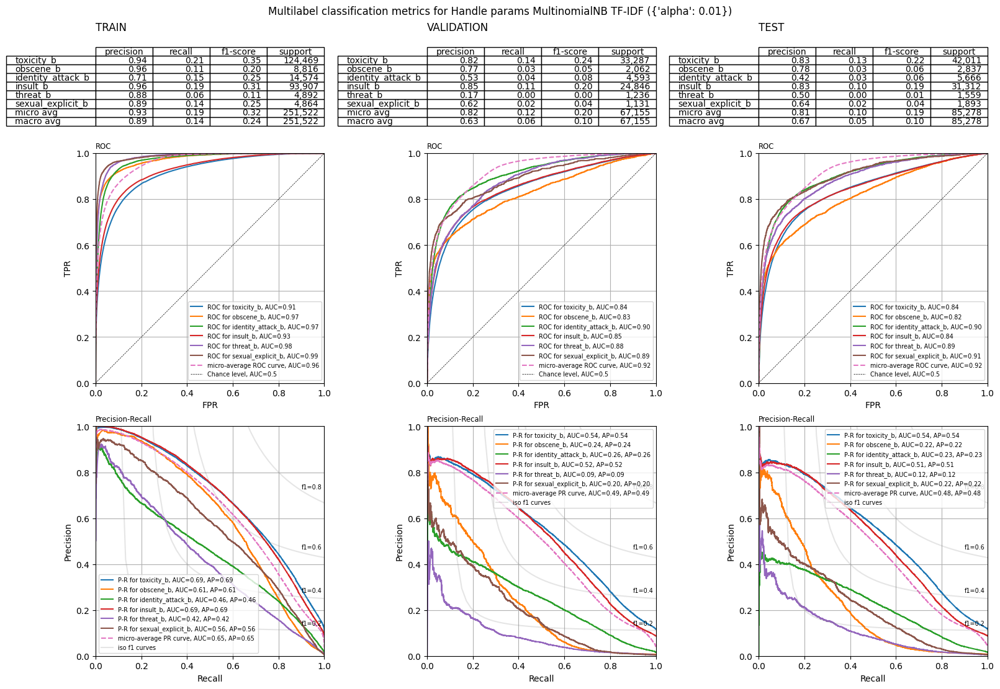

In [53]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_tfidf_pred_train,
    y_handle_params_nb_tfidf_pred_val,
    y_handle_params_nb_tfidf_pred_test,
    y_handle_params_nb_tfidf_pred_proba_train,
    y_handle_params_nb_tfidf_pred_proba_val,
    y_handle_params_nb_tfidf_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB TF-IDF ({nb_tfidf_handle_params})'
)

##### Биграммы

In [54]:
nb_tfidf_ngrams_handle_params = {'alpha': 0.01}
(
    y_handle_params_nb_tfidf_ngrams_pred_train,
    y_handle_params_nb_tfidf_ngrams_pred_val,
    y_handle_params_nb_tfidf_ngrams_pred_test,
    y_handle_params_nb_tfidf_ngrams_pred_proba_train,
    y_handle_params_nb_tfidf_ngrams_pred_proba_val,
    y_handle_params_nb_tfidf_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_ngrams_handle_params),
    X_train=X_train_tfidf_ngrams,
    X_val=X_val_tfidf_ngrams,
    X_test=X_test_tfidf_ngrams,
    y_train=y_train,
)

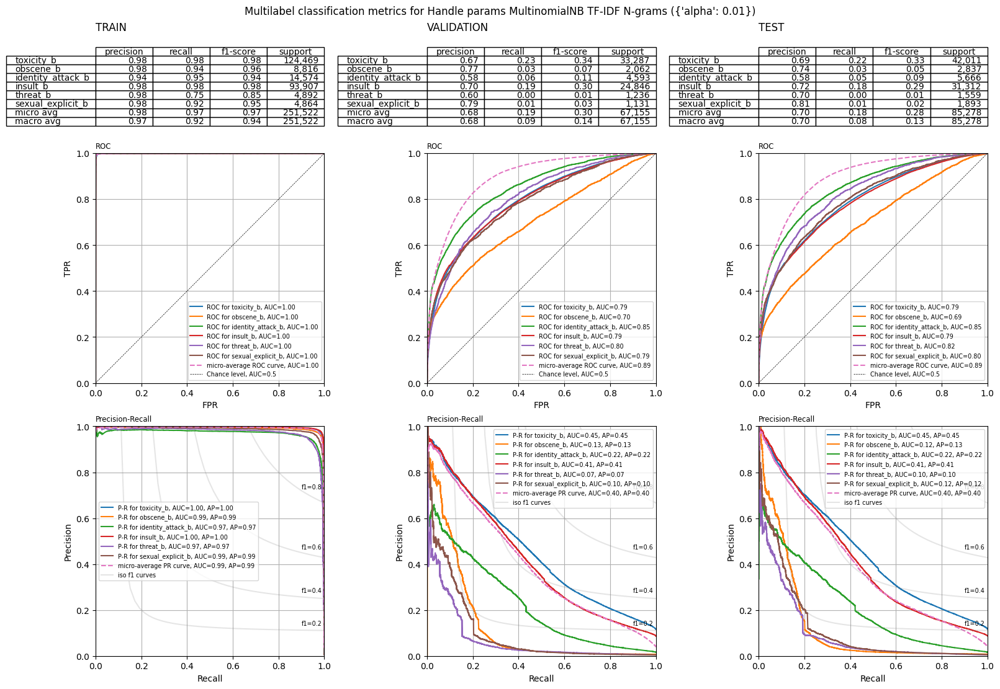

In [55]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_tfidf_ngrams_pred_train,
    y_handle_params_nb_tfidf_ngrams_pred_val,
    y_handle_params_nb_tfidf_ngrams_pred_test,
    y_handle_params_nb_tfidf_ngrams_pred_proba_train,
    y_handle_params_nb_tfidf_ngrams_pred_proba_val,
    y_handle_params_nb_tfidf_ngrams_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB TF-IDF N-grams ({nb_tfidf_ngrams_handle_params})'
)

Ситуация с обучением на TF-IDF в целом схожа с BoW. Однако метрики для двух лучших моделей с гиперпараметрами чуть лучше, чем для случая обучения на BoW. При этом переобучение моделей MultinomialNB в обоих случаях продолжает лететь в космос.

В рбоих случаях балансировка с помощью параметра `class_weight='balanced'` не дала результатов, а в некоторых случаях балансировка ухудшала ситуацию, поэтому ее было решено не использовать.

## Обучение с подбором параметров

In [25]:
def get_hyperparams(X_train, X_val, y_train, y_val, objective_func, n_trials=50):
    study = optuna.create_study(direction='maximize')
    study.optimize(partial(
        objective_func,
        X_train=X_train, X_val=X_val,
        y_train=y_train, y_val=y_val
    ), n_trials=n_trials)
    
    return study.best_params

In [148]:
def multi_label_log_reg_objective(trial, X_train, X_val, y_train, y_val):
    C = trial.suggest_float('C', 1e-5, 1, log=True)
    max_iter = trial.suggest_int('max_iter', 100, 1000)
    
    log_reg = LogisticRegression(C=C, max_iter=max_iter)
    clf = MultiOutputClassifier(log_reg, n_jobs=-1)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_val)
    return f1_score(y_val, y_pred, average='micro')

def multi_label_svc_objective(trial, X_train, X_val, y_train, y_val):
    C = trial.suggest_float('C', 1e-5, 1, log=True)
    max_iter = trial.suggest_int('max_iter', 1000, 10000)
    
    svc = LinearSVC(C=C, max_iter=max_iter)
    clf = MultiOutputClassifier(svc, n_jobs=-1)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_val)
    return f1_score(y_val, y_pred, average='micro')

def multi_label_mnb_objective(trial, X_train, X_val, y_train, y_val):
    alpha = trial.suggest_float('alpha', 1e-2, 1, log=True)
    
    mnb = MultinomialNB(alpha=alpha)
    clf = MultiOutputClassifier(mnb, n_jobs=-1)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_val)
    return f1_score(y_val, y_pred, average='micro')

### Обучение с мешком слов

#### Логистическая регрессия

In [153]:
log_reg_bow_best_params = get_hyperparams(X_train_bow, X_val_bow, y_train, y_val, multi_label_log_reg_objective, n_trials=50)

[I 2024-12-07 00:57:45,097] A new study created in memory with name: no-name-4ea0de6e-83ac-4362-a451-2b24d884acd4
[I 2024-12-07 00:57:50,353] Trial 0 finished with value: 0.012635245841144256 and parameters: {'C': 9.381964771025775e-05, 'max_iter': 489}. Best is trial 0 with value: 0.012635245841144256.
[I 2024-12-07 00:58:04,745] Trial 1 finished with value: 0.5538224854264557 and parameters: {'C': 0.40618808304722825, 'max_iter': 735}. Best is trial 1 with value: 0.5538224854264557.
[I 2024-12-07 00:58:22,601] Trial 2 finished with value: 0.558899555182083 and parameters: {'C': 0.9579421506611369, 'max_iter': 737}. Best is trial 2 with value: 0.558899555182083.
[I 2024-12-07 00:58:25,662] Trial 3 finished with value: 0.019772019507609144 and parameters: {'C': 0.00012208187660169332, 'max_iter': 294}. Best is trial 2 with value: 0.558899555182083.
[I 2024-12-07 00:58:29,723] Trial 4 finished with value: 0.22079757438717304 and parameters: {'C': 0.0009965538225832418, 'max_iter': 652}.

In [ ]:
(
    y_optuna_log_reg_bow_pred_train,
    y_optuna_log_reg_bow_pred_val,
    y_optuna_log_reg_bow_pred_test,
    y_optuna_log_reg_bow_pred_proba_train,
    y_optuna_log_reg_bow_pred_proba_val,
    y_optuna_log_reg_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_bow_best_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

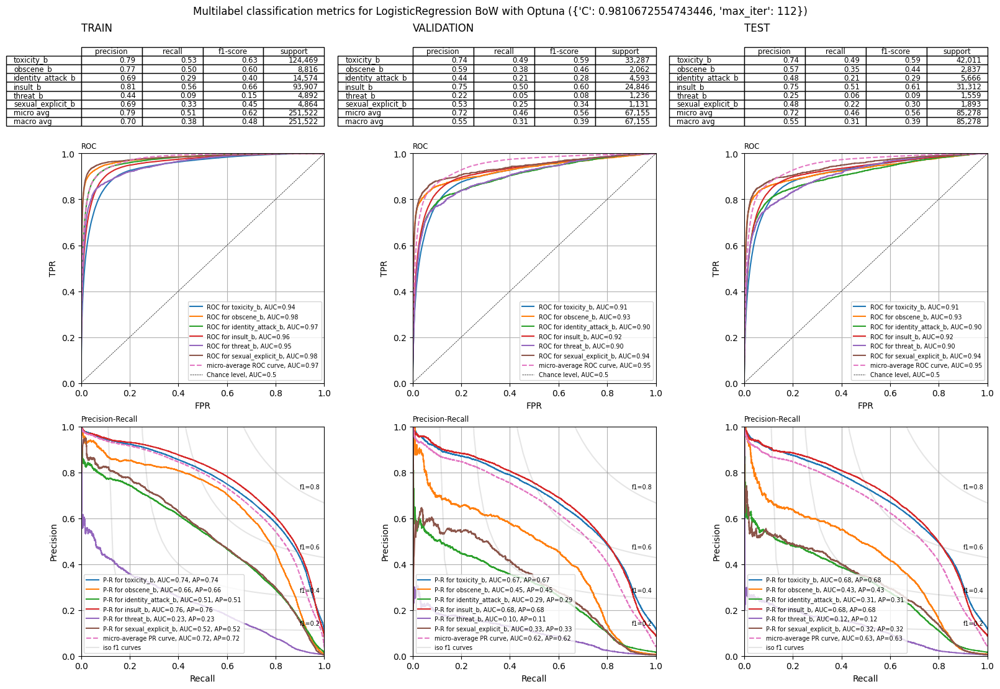

In [161]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_log_reg_bow_pred_train,
    y_optuna_log_reg_bow_pred_val,
    y_optuna_log_reg_bow_pred_test,
    y_optuna_log_reg_bow_pred_proba_train,
    y_optuna_log_reg_bow_pred_proba_val,
    y_optuna_log_reg_bow_pred_proba_test,
    y_train.columns,
    f'LogisticRegression BoW with Optuna ({log_reg_bow_best_params})'
)

#### SVM

In [155]:
svm_bow_best_params = get_hyperparams(X_train_bow, X_val_bow, y_train, y_val, multi_label_svc_objective, n_trials=50)

[I 2024-12-07 01:07:06,333] A new study created in memory with name: no-name-edadaf44-3eaf-4e09-b140-1719ea51c96e
[I 2024-12-07 01:07:14,223] Trial 0 finished with value: 0.061887008890163464 and parameters: {'C': 2.927421091346096e-05, 'max_iter': 7849}. Best is trial 0 with value: 0.061887008890163464.
[I 2024-12-07 01:07:22,202] Trial 1 finished with value: 0.09483812065454035 and parameters: {'C': 4.1671803812287444e-05, 'max_iter': 2514}. Best is trial 1 with value: 0.09483812065454035.
[I 2024-12-07 01:07:33,185] Trial 2 finished with value: 0.32220720666850045 and parameters: {'C': 0.00026080394469328946, 'max_iter': 9469}. Best is trial 2 with value: 0.32220720666850045.
[I 2024-12-07 01:07:40,683] Trial 3 finished with value: 0.06742793442997813 and parameters: {'C': 3.1179647552887384e-05, 'max_iter': 8280}. Best is trial 2 with value: 0.32220720666850045.
[I 2024-12-07 01:07:46,757] Trial 4 finished with value: 0.01384624468587624 and parameters: {'C': 1.2164801427218979e-05

In [156]:
(
    y_optuna_svm_bow_pred_train,
    y_optuna_svm_bow_pred_val,
    y_optuna_svm_bow_pred_test,
    y_optuna_svm_bow_pred_proba_train,
    y_optuna_svm_bow_pred_proba_val,
    y_optuna_svm_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_bow_best_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

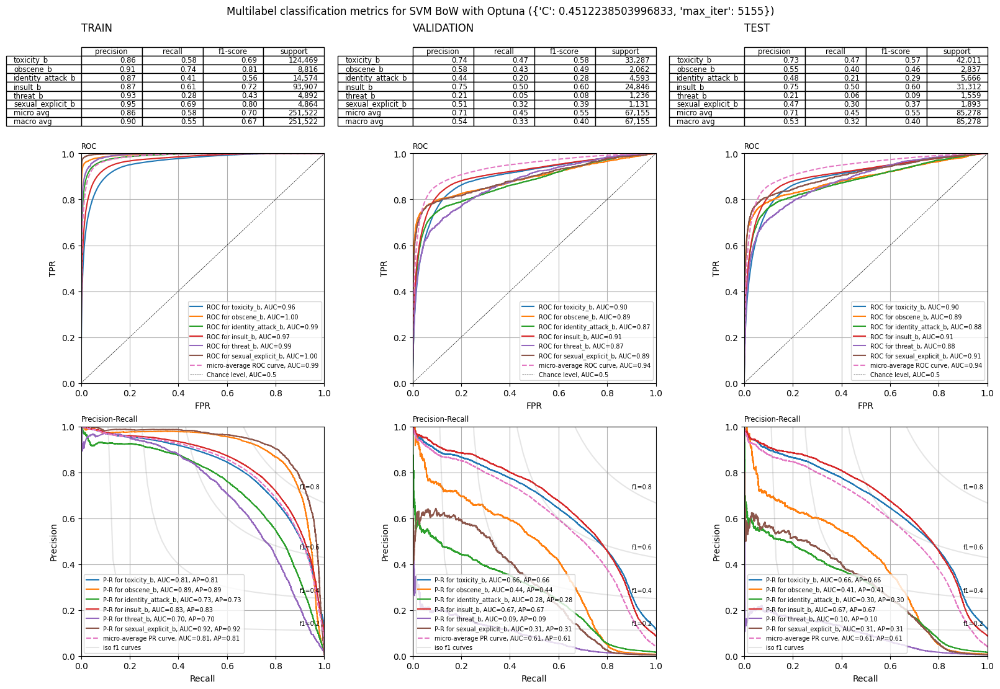

In [162]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_svm_bow_pred_train,
    y_optuna_svm_bow_pred_val,
    y_optuna_svm_bow_pred_test,
    y_optuna_svm_bow_pred_proba_train,
    y_optuna_svm_bow_pred_proba_val,
    y_optuna_svm_bow_pred_proba_test,
    y_train.columns,
    f'SVM BoW with Optuna ({svm_bow_best_params})'
)

#### Наивный Байес

##### Слова

In [157]:
nb_bow_best_params = get_hyperparams(X_train_bow, X_val_bow, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 02:53:16,989] A new study created in memory with name: no-name-a3379fac-7eff-49b8-b56e-61ac57a02337
[I 2024-12-07 02:53:18,256] Trial 0 finished with value: 0.46931792343483975 and parameters: {'alpha': 0.07605454385405847}. Best is trial 0 with value: 0.46931792343483975.
[I 2024-12-07 02:53:19,507] Trial 1 finished with value: 0.46511602246521533 and parameters: {'alpha': 0.04737047274816167}. Best is trial 0 with value: 0.46931792343483975.
[I 2024-12-07 02:53:20,766] Trial 2 finished with value: 0.47228339239204553 and parameters: {'alpha': 0.10809057501073056}. Best is trial 2 with value: 0.47228339239204553.
[I 2024-12-07 02:53:22,023] Trial 3 finished with value: 0.469491694683932 and parameters: {'alpha': 0.0777802793787041}. Best is trial 2 with value: 0.47228339239204553.
[I 2024-12-07 02:53:23,249] Trial 4 finished with value: 0.4719478764802108 and parameters: {'alpha': 0.10333070064822328}. Best is trial 2 with value: 0.47228339239204553.
[I 2024-12-07 02:53:

In [158]:
(
    y_optuna_nb_bow_pred_train,
    y_optuna_nb_bow_pred_val,
    y_optuna_nb_bow_pred_test,
    y_optuna_nb_bow_pred_proba_train,
    y_optuna_nb_bow_pred_proba_val,
    y_optuna_nb_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_best_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

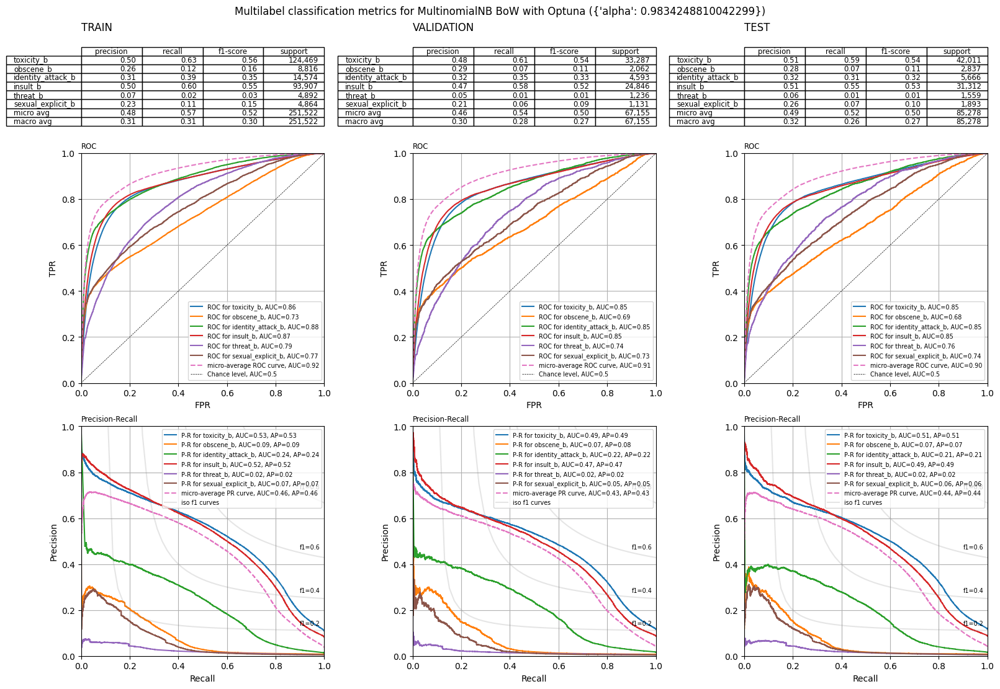

In [163]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_bow_pred_train,
    y_optuna_nb_bow_pred_val,
    y_optuna_nb_bow_pred_test,
    y_optuna_nb_bow_pred_proba_train,
    y_optuna_nb_bow_pred_proba_val,
    y_optuna_nb_bow_pred_proba_test,
    y_train.columns,
    f'MultinomialNB BoW with Optuna ({nb_bow_best_params})'
)

##### Биграммы

In [159]:
nb_bow_ngrams_best_params = get_hyperparams(X_train_bow_ngrams, X_val_bow_ngrams, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 02:54:22,785] A new study created in memory with name: no-name-393a6f01-e197-41fb-862f-e6ce47bc2190
[I 2024-12-07 02:54:33,210] Trial 0 finished with value: 0.3735872659822276 and parameters: {'alpha': 0.4287035352432803}. Best is trial 0 with value: 0.3735872659822276.
[I 2024-12-07 02:54:40,560] Trial 1 finished with value: 0.17634644154733917 and parameters: {'alpha': 0.9464941205295907}. Best is trial 0 with value: 0.3735872659822276.
[I 2024-12-07 02:54:47,940] Trial 2 finished with value: 0.4594244976571708 and parameters: {'alpha': 0.06133917873159723}. Best is trial 2 with value: 0.4594244976571708.
[I 2024-12-07 02:54:55,602] Trial 3 finished with value: 0.3115991441134285 and parameters: {'alpha': 0.5601533414508552}. Best is trial 2 with value: 0.4594244976571708.
[I 2024-12-07 02:55:02,750] Trial 4 finished with value: 0.43719028110287217 and parameters: {'alpha': 0.0245450983261159}. Best is trial 2 with value: 0.4594244976571708.
[I 2024-12-07 02:55:09,878] 

In [160]:
(
    y_optuna_nb_bow_ngrams_pred_train,
    y_optuna_nb_bow_ngrams_pred_val,
    y_optuna_nb_bow_ngrams_pred_test,
    y_optuna_nb_bow_ngrams_pred_proba_train,
    y_optuna_nb_bow_ngrams_pred_proba_val,
    y_optuna_nb_bow_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_ngrams_best_params),
    X_train=X_train_bow_ngrams,
    X_val=X_val_bow_ngrams,
    X_test=X_test_bow_ngrams,
    y_train=y_train,
)

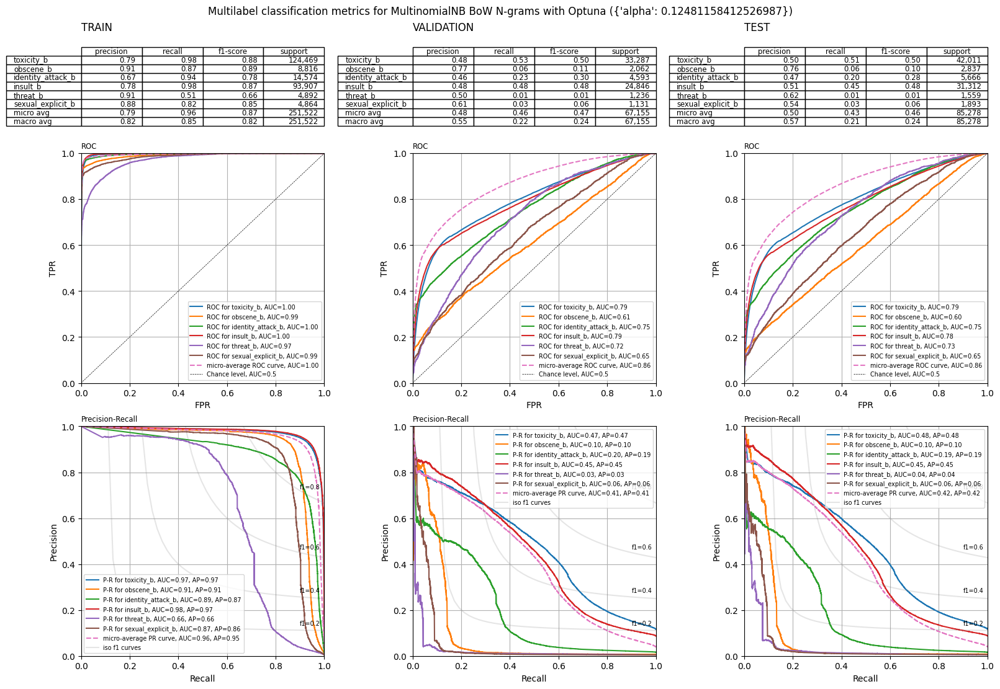

In [164]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_bow_ngrams_pred_train,
    y_optuna_nb_bow_ngrams_pred_val,
    y_optuna_nb_bow_ngrams_pred_test,
    y_optuna_nb_bow_ngrams_pred_proba_train,
    y_optuna_nb_bow_ngrams_pred_proba_val,
    y_optuna_nb_bow_ngrams_pred_proba_test,
    y_train.columns,
    f'MultinomialNB BoW N-grams with Optuna ({nb_bow_ngrams_best_params})'
)

Метрики LogisticRegression и LinearSVC практически не изменились.

В случае с MultinomialNB на словах метрики выросли и снизилось переобучение. На биграммах все так же плохо)

### Обучение с TF-IDF

#### Логистическая регрессия

In [165]:
log_reg_tfidf_best_params = get_hyperparams(X_train_tfidf, X_val_tfidf, y_train, y_val, multi_label_log_reg_objective, n_trials=50)

[I 2024-12-07 03:04:27,046] A new study created in memory with name: no-name-65574509-b793-4f62-953d-22392124e09c
[I 2024-12-07 03:04:32,634] Trial 0 finished with value: 0.3249966629048503 and parameters: {'C': 0.03417294049743109, 'max_iter': 478}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:34,813] Trial 1 finished with value: 0.0 and parameters: {'C': 5.865265802207369e-05, 'max_iter': 874}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:38,010] Trial 2 finished with value: 0.0016366612111292963 and parameters: {'C': 0.0018400115985782394, 'max_iter': 184}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:42,248] Trial 3 finished with value: 0.1728385057936958 and parameters: {'C': 0.014050316850718982, 'max_iter': 206}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:45,941] Trial 4 finished with value: 0.11335227670385353 and parameters: {'C': 0.009714072596754386, 'max_iter': 628}. Best is trial 

In [166]:
(
    y_optuna_log_reg_tfidf_pred_train,
    y_optuna_log_reg_tfidf_pred_val,
    y_optuna_log_reg_tfidf_pred_test,
    y_optuna_log_reg_tfidf_pred_proba_train,
    y_optuna_log_reg_tfidf_pred_proba_val,
    y_optuna_log_reg_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_tfidf_best_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

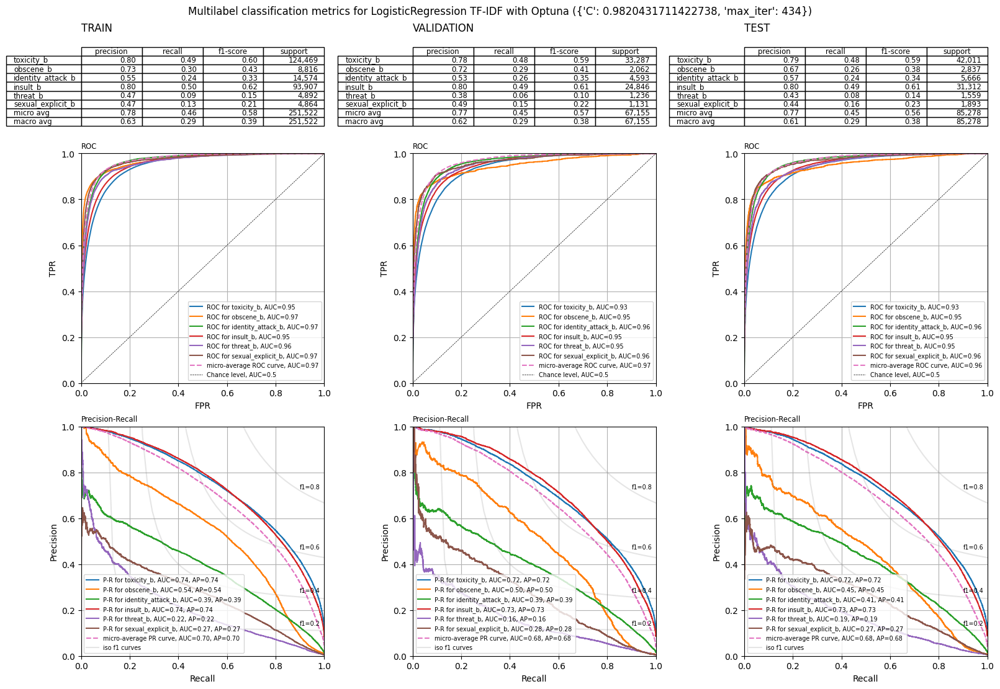

In [173]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_log_reg_tfidf_pred_train,
    y_optuna_log_reg_tfidf_pred_val,
    y_optuna_log_reg_tfidf_pred_test,
    y_optuna_log_reg_tfidf_pred_proba_train,
    y_optuna_log_reg_tfidf_pred_proba_val,
    y_optuna_log_reg_tfidf_pred_proba_test,
    y_train.columns,
    f'LogisticRegression TF-IDF with Optuna ({log_reg_tfidf_best_params})'
)

#### SVM

In [167]:
svm_tfidf_best_params = get_hyperparams(X_train_tfidf, X_val_tfidf, y_train, y_val, multi_label_svc_objective, n_trials=50)

[I 2024-12-07 03:08:55,367] A new study created in memory with name: no-name-babf5c05-3f4e-4cac-9233-13a8bf879b67
[I 2024-12-07 03:08:59,999] Trial 0 finished with value: 0.000863300785901405 and parameters: {'C': 0.00014363640569853048, 'max_iter': 4086}. Best is trial 0 with value: 0.000863300785901405.
[I 2024-12-07 03:09:07,053] Trial 1 finished with value: 0.3232841878774542 and parameters: {'C': 0.003644923067509568, 'max_iter': 2623}. Best is trial 1 with value: 0.3232841878774542.
[I 2024-12-07 03:09:10,035] Trial 2 finished with value: 0.0 and parameters: {'C': 1.3939141731252175e-05, 'max_iter': 1545}. Best is trial 1 with value: 0.3232841878774542.
[I 2024-12-07 03:09:16,993] Trial 3 finished with value: 0.37256793318433123 and parameters: {'C': 0.005205024036431509, 'max_iter': 2184}. Best is trial 3 with value: 0.37256793318433123.
[I 2024-12-07 03:09:21,462] Trial 4 finished with value: 0.025572064723777613 and parameters: {'C': 0.00043793713227180636, 'max_iter': 2651}. 

In [168]:
(
    y_optuna_svm_tfidf_pred_train,
    y_optuna_svm_tfidf_pred_val,
    y_optuna_svm_tfidf_pred_test,
    y_optuna_svm_tfidf_pred_proba_train,
    y_optuna_svm_tfidf_pred_proba_val,
    y_optuna_svm_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_tfidf_best_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

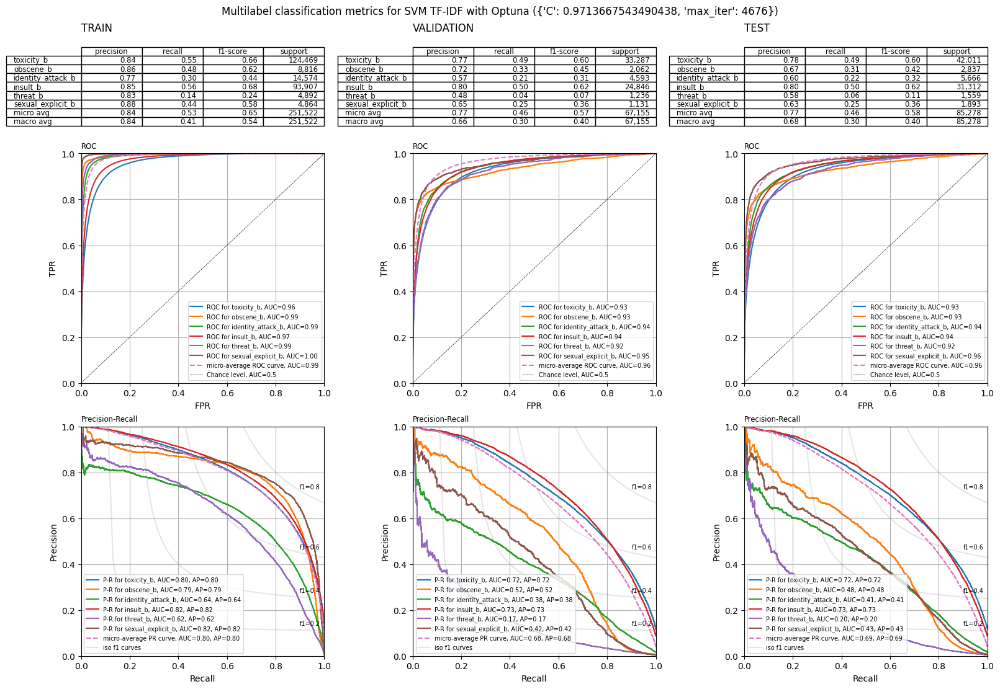

In [174]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_svm_tfidf_pred_train,
    y_optuna_svm_tfidf_pred_val,
    y_optuna_svm_tfidf_pred_test,
    y_optuna_svm_tfidf_pred_proba_train,
    y_optuna_svm_tfidf_pred_proba_val,
    y_optuna_svm_tfidf_pred_proba_test,
    y_train.columns,
    f'SVM TF-IDF with Optuna ({svm_tfidf_best_params})'
)

#### Наивный Байес

##### Слова

In [169]:
nb_tfidf_best_params = get_hyperparams(X_train_tfidf, X_val_tfidf, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 03:20:58,136] A new study created in memory with name: no-name-5567df00-d48b-4afd-bcb2-9729d9d08da2
[I 2024-12-07 03:20:59,126] Trial 0 finished with value: 0.08563759533040774 and parameters: {'alpha': 0.8690083999835619}. Best is trial 0 with value: 0.08563759533040774.
[I 2024-12-07 03:21:00,147] Trial 1 finished with value: 0.20228333791047118 and parameters: {'alpha': 0.019796684328652635}. Best is trial 1 with value: 0.20228333791047118.
[I 2024-12-07 03:21:01,262] Trial 2 finished with value: 0.1831865833677452 and parameters: {'alpha': 0.11340847918980211}. Best is trial 1 with value: 0.20228333791047118.
[I 2024-12-07 03:21:02,220] Trial 3 finished with value: 0.19945900519985293 and parameters: {'alpha': 0.036930742613212456}. Best is trial 1 with value: 0.20228333791047118.
[I 2024-12-07 03:21:03,241] Trial 4 finished with value: 0.20342123461944964 and parameters: {'alpha': 0.01130754276234004}. Best is trial 4 with value: 0.20342123461944964.
[I 2024-12-07 03

In [170]:
(
    y_optuna_nb_tfidf_pred_train,
    y_optuna_nb_tfidf_pred_val,
    y_optuna_nb_tfidf_pred_test,
    y_optuna_nb_tfidf_pred_proba_train,
    y_optuna_nb_tfidf_pred_proba_val,
    y_optuna_nb_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_best_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

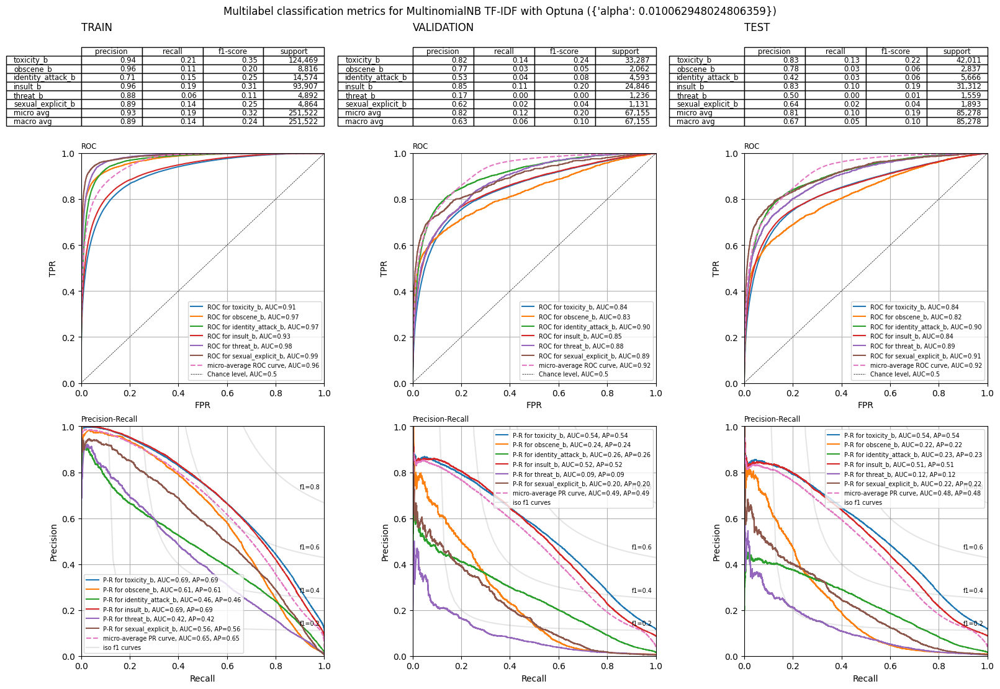

In [175]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_tfidf_pred_train,
    y_optuna_nb_tfidf_pred_val,
    y_optuna_nb_tfidf_pred_test,
    y_optuna_nb_tfidf_pred_proba_train,
    y_optuna_nb_tfidf_pred_proba_val,
    y_optuna_nb_tfidf_pred_proba_test,
    y_train.columns,
    f'MultinomialNB TF-IDF with Optuna ({nb_tfidf_best_params})'
)

##### Биграммы

In [171]:
nb_tfidf_ngrams_best_params = get_hyperparams(X_train_tfidf_ngrams, X_val_tfidf_ngrams, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 03:21:57,255] A new study created in memory with name: no-name-a022626a-6f1f-4383-9412-5a5635602354
[I 2024-12-07 03:22:09,763] Trial 0 finished with value: 0.25517198636504496 and parameters: {'alpha': 0.028155022617816664}. Best is trial 0 with value: 0.25517198636504496.
[I 2024-12-07 03:22:17,631] Trial 1 finished with value: 0.015013373132563948 and parameters: {'alpha': 0.5055572435318164}. Best is trial 0 with value: 0.25517198636504496.
[I 2024-12-07 03:22:24,788] Trial 2 finished with value: 0.29119415301190615 and parameters: {'alpha': 0.014042095057714128}. Best is trial 2 with value: 0.29119415301190615.
[I 2024-12-07 03:22:31,930] Trial 3 finished with value: 0.0087175685693106 and parameters: {'alpha': 0.8490654071972933}. Best is trial 2 with value: 0.29119415301190615.
[I 2024-12-07 03:22:39,590] Trial 4 finished with value: 0.13043478260869565 and parameters: {'alpha': 0.08349269350691034}. Best is trial 2 with value: 0.29119415301190615.
[I 2024-12-07 03

In [172]:
(
    y_optuna_nb_tfidf_ngrams_pred_train,
    y_optuna_nb_tfidf_ngrams_pred_val,
    y_optuna_nb_tfidf_ngrams_pred_test,
    y_optuna_nb_tfidf_ngrams_pred_proba_train,
    y_optuna_nb_tfidf_ngrams_pred_proba_val,
    y_optuna_nb_tfidf_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_ngrams_best_params),
    X_train=X_train_tfidf_ngrams,
    X_val=X_val_tfidf_ngrams,
    X_test=X_test_tfidf_ngrams,
    y_train=y_train,
)

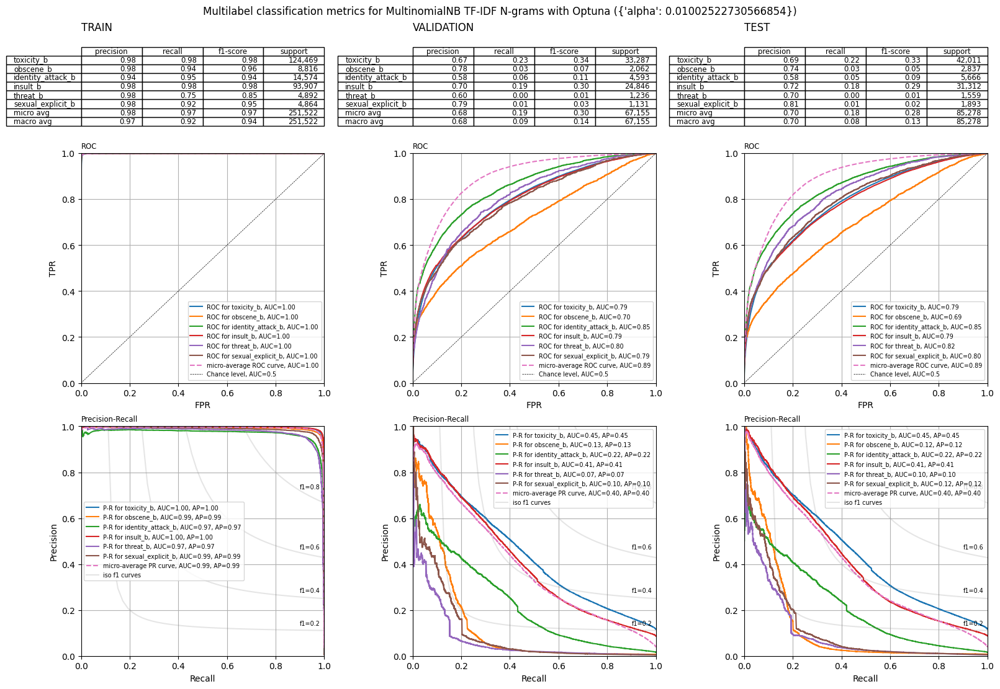

In [176]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_tfidf_ngrams_pred_train,
    y_optuna_nb_tfidf_ngrams_pred_val,
    y_optuna_nb_tfidf_ngrams_pred_test,
    y_optuna_nb_tfidf_ngrams_pred_proba_train,
    y_optuna_nb_tfidf_ngrams_pred_proba_val,
    y_optuna_nb_tfidf_ngrams_pred_proba_test,
    y_train.columns,
    f'MultinomialNB TF-IDF N-grams with Optuna ({nb_tfidf_ngrams_best_params})'
)

В случае с TF-IDF изменений практически нет относительно моделей с параметрами, заданными вручную.

## Бонус

Так же, как и для бинарной классификации, с целью хоть как-то улучшить результат базовых моделей было решено использовать градиентный бустинг. Для обучения данных моделей будет применяться только мешок слов (BoW), так как TF-IDF не дает сильного прироста у лучших моделей, а ресурсов и времени на обучение требует сильно больше. А для модели MultinomialNB лучшие результаты дает именно мешок слов.

### Градиентный бустинг

Для обучения была выбрана модель `XGBClassifier`, т.к. обучается быстрее, а результаты практически не отличаются от обучения `CatBoost`. Для начала рассмотрим насколько хорошо эта модель обучатся без подбора гиперпараметров, а затем уже подберем их с помощью optuna.

#### Обучение без подбора гиперпараметров

##### Мешок слов

In [ ]:
(
    y_cb_bow_pred_train,
    y_cb_bow_pred_val,
    y_cb_bow_pred_test,
    y_cb_bow_pred_proba_train,
    y_cb_bow_pred_proba_val,
    y_cb_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=XGBClassifier(use_label_encoder=False),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

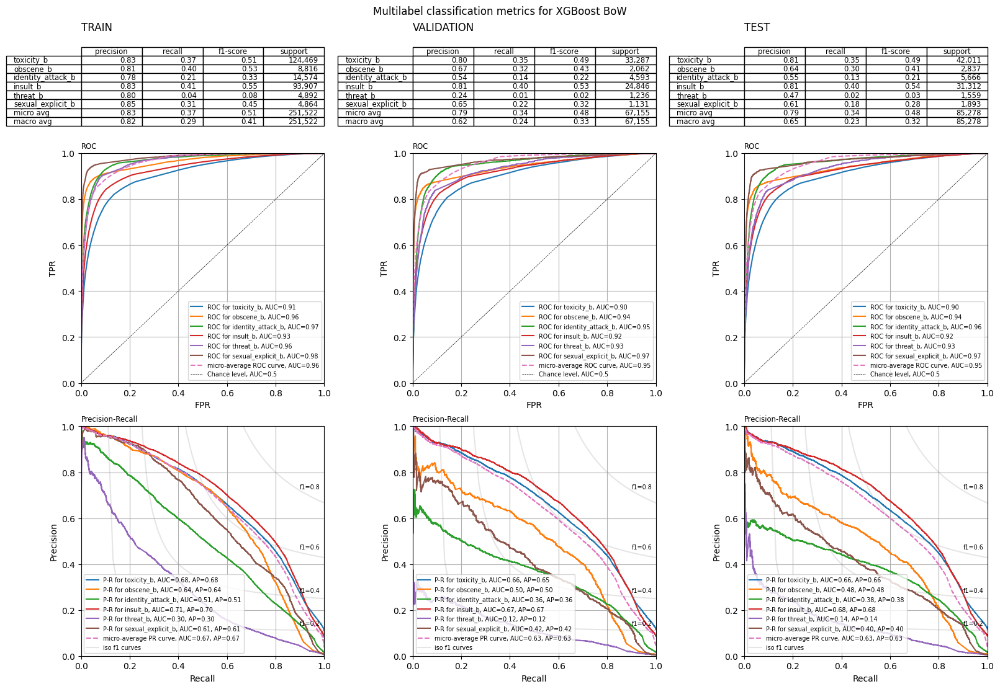

In [27]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_cb_bow_pred_train,
    y_cb_bow_pred_val,
    y_cb_bow_pred_test,
    y_cb_bow_pred_proba_train,
    y_cb_bow_pred_proba_val,
    y_cb_bow_pred_proba_test,
    y_train.columns,
    'XGBoost BoW'
)

#### Обучение с подбором гиперпараметров

In [ ]:
def multi_label_xg_objective(trial, X_train, X_val, y_train, y_val):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 200, 1000),
        "max_depth": trial.suggest_int("max_depth", 10, 30),
        "learning_rate": trial.suggest_float("learning_rate", 0.2, 0.5, log=True),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "random_state": 42,
        "use_label_encoder": False,
        "scale_pos_weight": trial.suggest_int("scale_pos_weight", 1, 10),
        # "n_jobs": 6,
    }
    
    xgbc = XGBClassifier(**params)
    clf = MultiOutputClassifier(xgbc, n_jobs=-1)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_val)
    return f1_score(y_val, y_pred, average='micro')

##### Мешок слов

In [ ]:
xg_bow_best_params = get_hyperparams(X_train_bow, X_val_bow, y_train, y_val, multi_label_xg_objective, n_trials=10)

In [39]:
(
    y_optuna_xg_bow_pred_train,
    y_optuna_xg_bow_pred_val,
    y_optuna_xg_bow_pred_test,
    y_optuna_xg_bow_pred_proba_train,
    y_optuna_xg_bow_pred_proba_val,
    y_optuna_xg_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=XGBClassifier(**xg_bow_best_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

In [47]:
pd.DataFrame.from_dict(xg_bow_best_params, orient='index', columns=["best_value"])

,best_value
n_estimators,429.00
max_depth,20.00
learning_rate,0.25
subsample,0.96
colsample_bytree,0.53
gamma,2.65
min_child_weight,9.00
scale_pos_weight,3.00


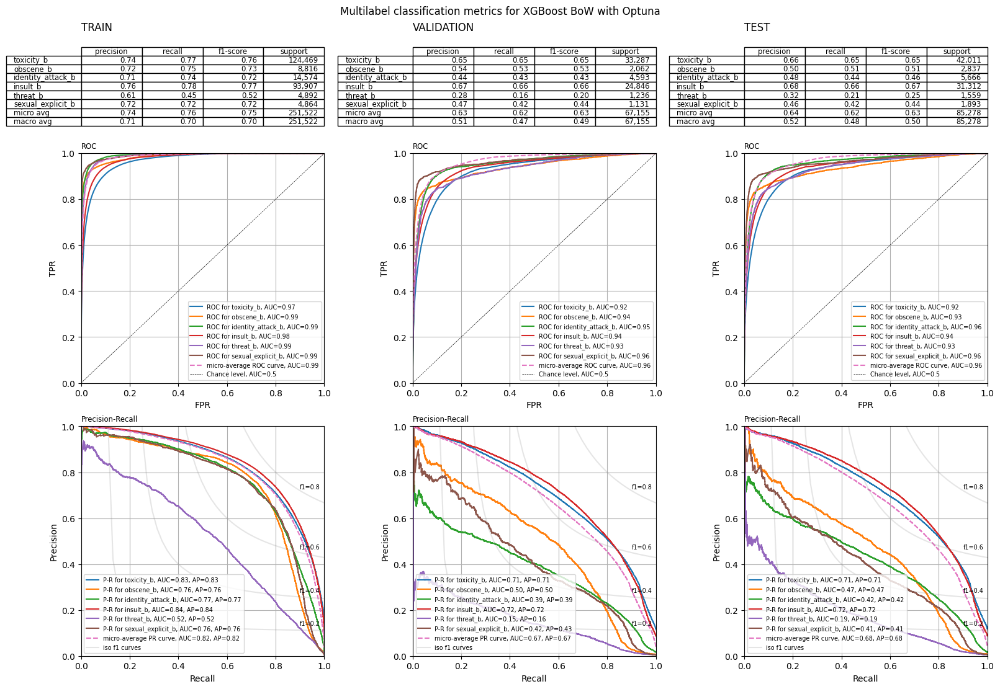

In [48]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_xg_bow_pred_train,
    y_optuna_xg_bow_pred_val,
    y_optuna_xg_bow_pred_test,
    y_optuna_xg_bow_pred_proba_train,
    y_optuna_xg_bow_pred_proba_val,
    y_optuna_xg_bow_pred_proba_test,
    y_train.columns,
    f'XGBoost BoW with Optuna'
)

Градиентный бустинг без подбора параметров показывает себя слегка хуже при обучении на мешке слов, чем модели LinearSVC и LogisticRegression. Однако при подборе гиперпараметров через optuna XGBoost показывает наиболее сбалансированные результаты в плане метрик precision и recall, что говорит о том, что модели относительно неплохо различают бОльшую часть классов, а также они показывают наиболее высокие значения метрик.

# Выводы

На текущий момент наилучшим образом для наших задач среди классических моделей показала себя модели LogisticRegression и LinearSVC с TF-IDF векторизацией, они идут почти вровень, но на основном классе `toxicity` результат показывают чуть хуже, чем бинарная классификация. Однако использование более продвинутых моделей машинного обучения по типу XGBoost хоть и не выдают сильно высокие показатели метрик precision и recall, но имеют между этими метриками неплохой баланс, что в итоге дает более высокие показатели метрики F1 у этих моделей. По итогу можно сделать вывод, что для будущего построения сервиса с multilable классификацией, основанного на ML методах, наиболее подходящими моделями являются модели градиентного бустинга или (возможно) другие продвинутые модели машинного обучения.